# Analysis Pipeline for scRNA-seq Data from Native, Transplanted, and 3D organoid AT2 cells
### Louie, Moye, Wong et al. 2022 Cell Reports
Our study determined the ability of 3D AT2 organoids to retain progenitor function when transplanted into recipeint mice.

This notebook describes the bioinformatics analysis used to understand transcriptional states associated with Native AT2 cells (CD31- CD45- EPCAM+ SCA1-), 3D AT2 organoids, and 3D AT2 organoids after being transplanted into recipient mice.

## Raw reads and 10X Geonmics files can be found using the accession code - GEO: GSE190565

In [2]:
# packages

import os
import glob
import scanpy as sc
import scanpy.external as sce
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from seaborn import despine
from seaborn import axes_style
import magic # imputation tool; van Dijk et al 2018 # 
from matplotlib.pyplot import suptitle
import matplotlib.colors
import time
from matplotlib.ticker import FormatStrFormatter # manually set # y tick decimal places
import scvelo as scv # RNA velocity

sc.settings.verbosity = 0  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)

/home/alm72/.conda/envs/sharon_org_env/lib/python3.8/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


scanpy==1.4.6 anndata==0.7.1 umap==0.4.4 numpy==1.18.5 scipy==1.4.1 pandas==1.0.4 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2


#### h5 data was imported and QC metric added

In [3]:
# Import files
filenames = [
'PATH_TO_FILES/SL2 Sca1- M1 dsRed_filtered_feature_bc_matrix.h5',
'PATH_TO_FILES/SL3 Sca1- M2_filtered_feature_bc_matrix.h5',
'PATH_TO_FILES/SL5 Sca1- Org1_filtered_feature_bc_matrix.h5',
'PATH_TO_FILES/SL6 Sca1- Org2_filtered_feature_bc_matrix.h5',
'PATH_TO_FILES/SL12 Sca1- M3_filtered_feature_bc_matrix.h5',
'PATH_TO_FILES/SL14 Sca1- M4_filtered_feature_bc_matrix.h5',
'PATH_TO_FILES/SL15 Sca1- M4 dsRed_filtered_feature_bc_matrix.h5'
]

adatas = [sc.read_10x_h5(filename) for filename in filenames]
adata = adatas[0].concatenate(adatas[1:], batch_categories=['SL2','SL3','SL5','SL6','SL12','SL14','SL15'])
adata.var_names_make_unique() 

# add mito content and gene count information to adata.obs
mito_genes = adata.var_names.str.startswith('mt-')
adata.obs['percent_mito'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Vari

... storing 'feature_types' as categorical
... storing 'genome' as categorical


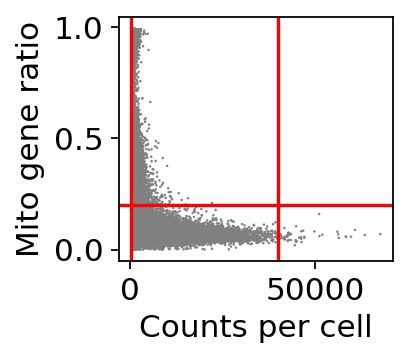

In [4]:
# Plot mito content/count correlation

with axes_style({'axes.grid': False}):
    rcParams['figure.figsize']=3,2
    sc.pl.scatter(adata, y='percent_mito', x='n_counts', size=5, show = False)
    plt.axvline(40000, color='red') # outlier read count - maximum
    plt.axvline(200, color='red') # outlier read count - minimum
    plt.axhline(0.2, color='red') # % mito filter = 20%
    plt.xlabel('Counts per cell')
    plt.ylabel('Mito gene ratio')
    plt.show()

Filter cells with high mito expression and low read counts

In [5]:
adata = adata[adata.obs['percent_mito'] < 0.2, :]
adata = adata[adata.obs['n_counts'] < 40000, :]
adata = adata[adata.obs['n_counts'] > 200, :]
sc.pp.filter_genes(adata, min_counts=1) # filter genes with zero counts
sc.pp.filter_genes(adata, min_cells=3) # filters genes not seen in at least three cells

Trying to set attribute `.var` of view, copying.


In [6]:
# normalize and log gene expression matrix
sc.pp.normalize_per_cell(adata)
sc.pp.log1p(adata)
adata.raw = adata # save seperate matrix as "raw"

##### Calculate PCA and highly variable genes (HVGs)

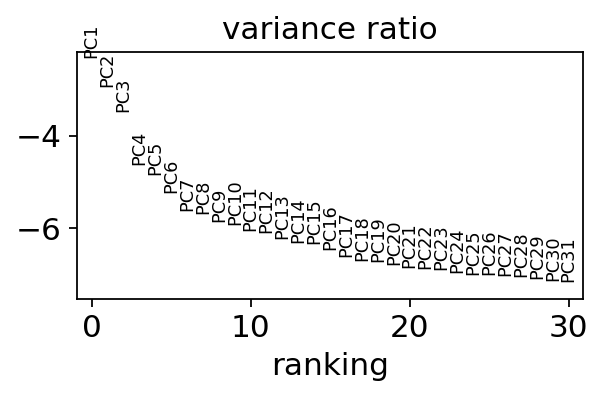

In [7]:
sc.tl.pca(adata, svd_solver='arpack') # svd_solver='arpack' is important for reproducibility

with axes_style({'axes.grid': False}):
    rcParams['figure.figsize']=4,2
    sc.pl.pca_variance_ratio(adata, log = True) 
    
# find highly variable genes 
sc.pp.highly_variable_genes(adata) 

#### Perform data denoising using MAGIC (https://pubmed.ncbi.nlm.nih.gov/29961576/). van Dijk et al 2018 Cell
* Multiple t values were visualized to determine the impact of data denoising to avoid over correction.
* Two genes knwon to be expression in AT2 cells (Lyz2 and Sftpc) were used.

Performing MAGIC
  Running MAGIC with `solver='exact'` on 20159-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Running MAGIC with `solver='exact'` on 20159-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Running MAGIC with `solver='exact'` on 20159-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
Plotting data
Total run time (min): 6.858739523092906


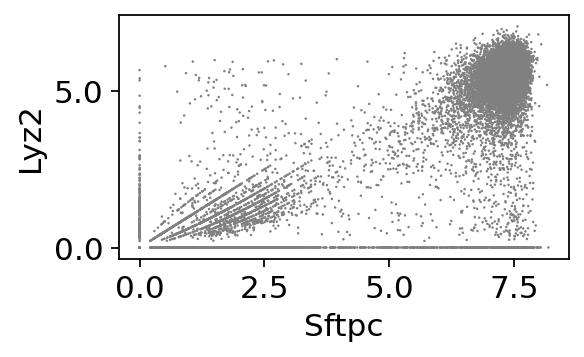

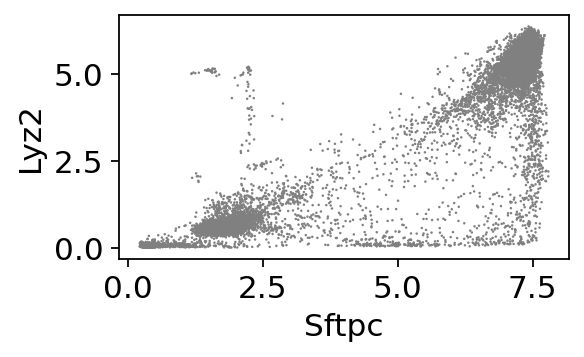

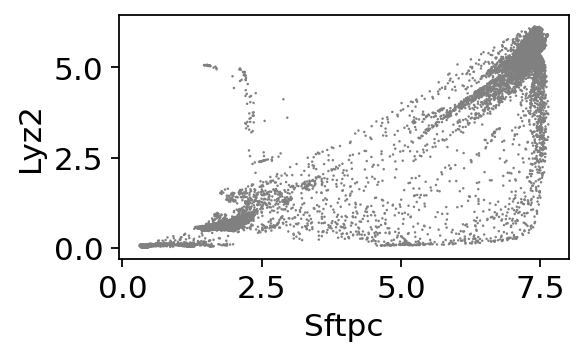

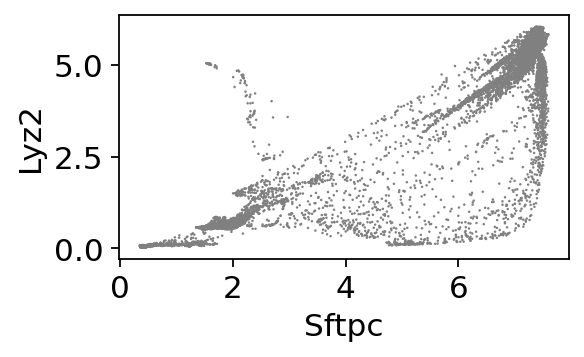

In [8]:
sc.pp.filter_genes(adata, min_counts=1) # zero counts cause MAGIC to break

from matplotlib.ticker import FormatStrFormatter # manually set # y tick decimal places

start = time.time()

# seperate adatas
adata2 = adata.copy()
adata5 = adata.copy()
adata7 = adata.copy()

# impute
print('Performing MAGIC')
sce.pp.magic(adata2, name_list='all_genes', knn=5, t=2, n_pca=20)
sce.pp.magic(adata5, name_list='all_genes', knn=5, t=5, n_pca=20)
sce.pp.magic(adata7, name_list='all_genes', knn=5, t=7, n_pca=20)

# plot sftpc-lyz2 correlation after different imputation t values 
adata_list = [adata, adata2, adata5, adata7]
print('Plotting data')
    
for i in adata_list:
    with axes_style({'axes.grid': False}):
        ax = sc.pl.scatter(i, x='Sftpc', y='Lyz2', size=5, use_raw=False, show=False)
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    
end = time.time()
print('Total run time (min):', (end - start)/60)

#### No benefit seen after t=5. Apply MAGIC (t=5) to the data

In [9]:
sce.pp.magic(adata, name_list='all_genes', knn=5, t=5, n_pca=20)

  Running MAGIC with `solver='exact'` on 20159-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.


#### Compute UMAP representation of the data

In [10]:
sc.pp.neighbors(adata, n_neighbors=5, n_pcs=20)
sc.tl.umap(adata)

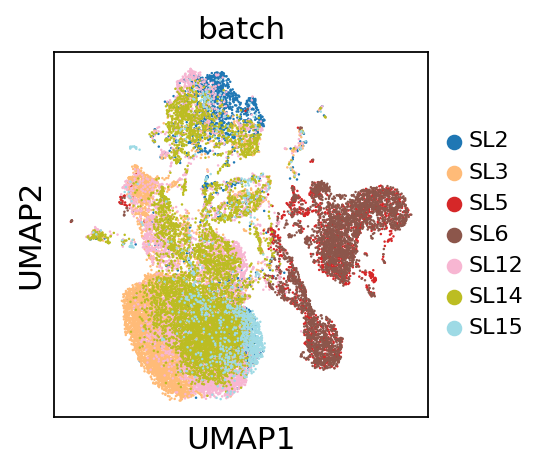

In [11]:
rcParams["figure.facecolor"]='white'
rcParams['figure.figsize']=3,3
sc.pl.umap(adata, projection='2d', color=['batch'], color_map='viridis',
wspace=1,legend_fontsize=10, size=5, palette='tab20')

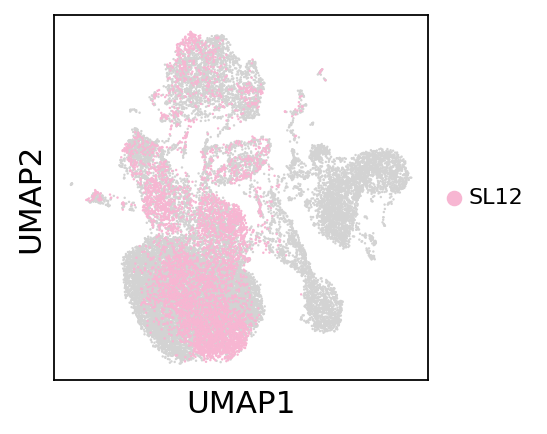

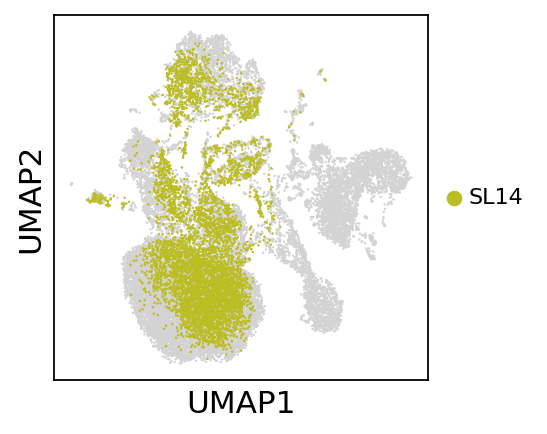

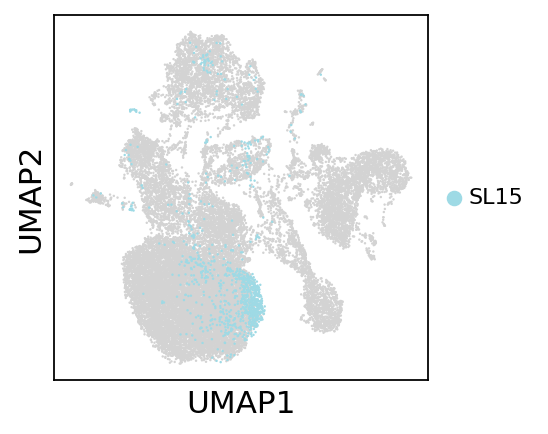

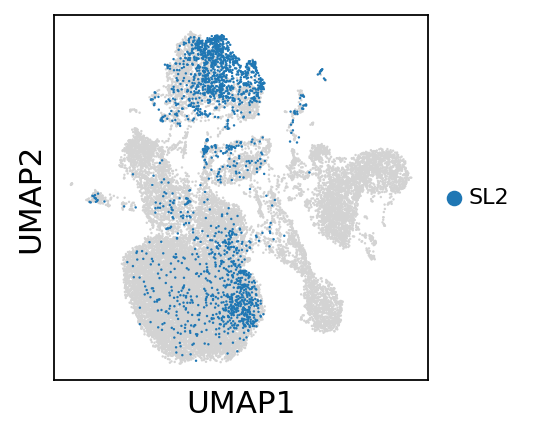

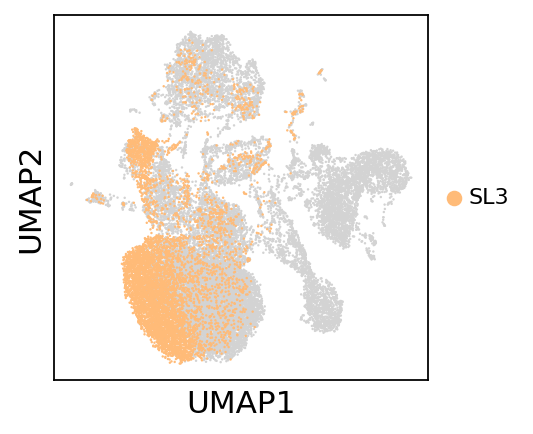

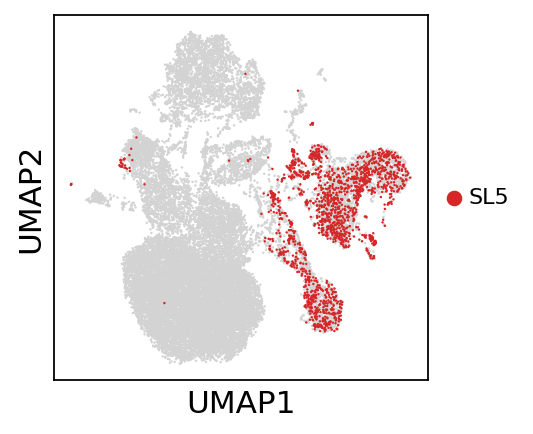

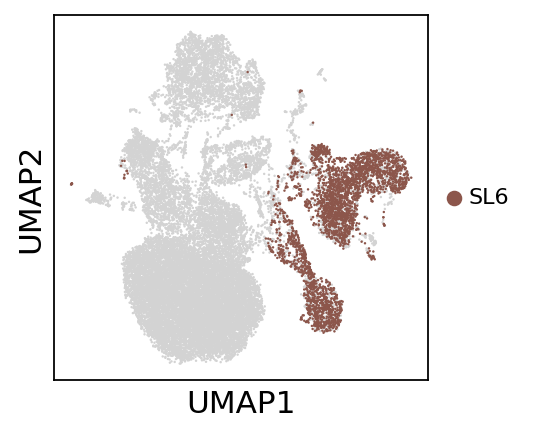

In [17]:
### View batches seperately

lst = sorted(list(set(adata.obs['batch']))) # list if groups

for i in lst:    
    rcParams['figure.figsize'] = 3,3
    rcParams['figure.facecolor']='white'
    sc.pl.umap(
        adata, 
        color='batch',
        groups = i,
        legend_loc = 'right margin',
        legend_fontsize = 10,
        show = False, frameon=True, title=''
    )

#### Plot the expression of key epithelial marker genes
- Vim (mesenchymal marker), from the organoid data.
- Foxj1 (Ciliated cells)
- Sftpc, Lyz2 (AT2 cells)
- Scgb1a1, Scgb3a2 (Club cells)

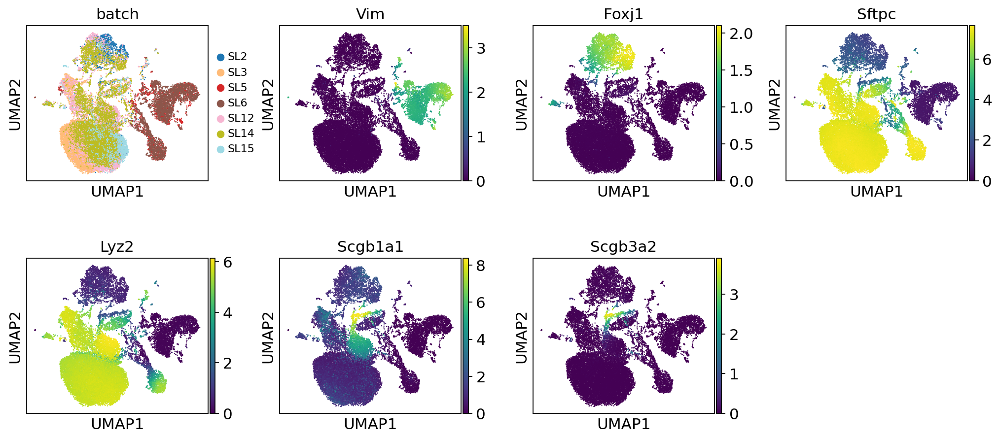

In [21]:
sc.pl.umap(adata, color=['batch','Vim','Foxj1','Sftpc','Lyz2','Scgb1a1','Scgb3a2'], hspace=0.5, legend_fontsize=10, legend_loc='right margin', size=5, 
frameon=True, color_map='viridis', use_raw=False, show=False, vmin=0)

... storing 'groups' as categorical


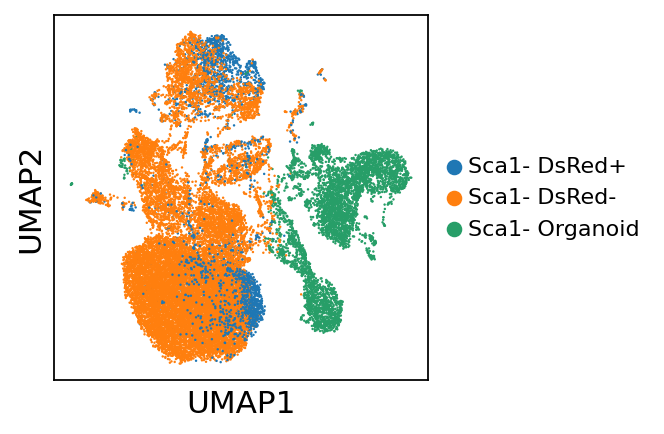

In [16]:
### Annotate cells as native, transplanted organoid cells, or primary organoid cultures then add to anndata.obs

scores = adata.obs[['batch']]

annotation = pd.Series('Unknown', index=scores.index)

# Add annotations
annotation[(scores.batch == 'SL5')|(scores.batch == 'SL6')] = 'Sca1- Organoid' 
annotation[(scores.batch == 'SL2')|(scores.batch == 'SL15')] = 'Sca1- DsRed+' 
annotation[(scores.batch == 'SL3')|(scores.batch == 'SL12')|(scores.batch == 'SL14')] = 'Sca1- DsRed-' 

 
adata.obs['groups'] = annotation

rcParams['figure.figsize'] = 3,3
sc.pl.umap(
    adata, 
    color='groups',
    legend_loc = 'right margin',
    legend_fontsize = 10,
    show = False, frameon=True, title=''
)

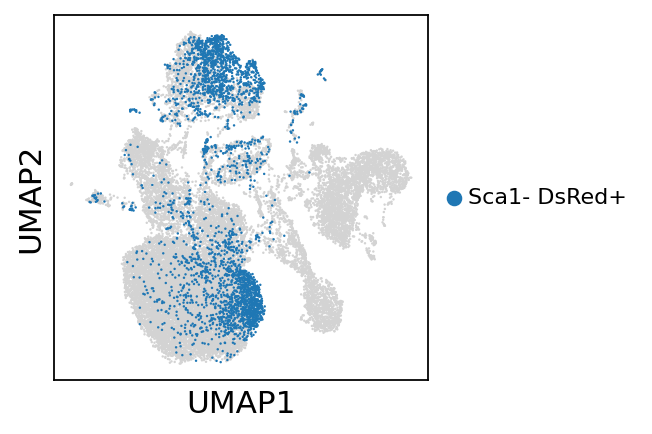

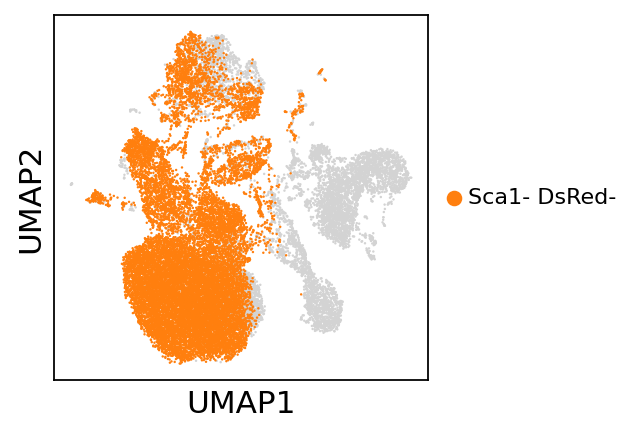

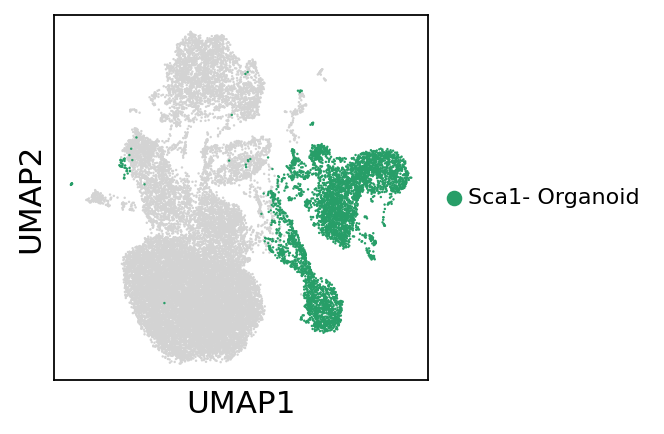

In [19]:
### View group annotations seperately

lst = sorted(list(set(adata.obs['groups']))) # list if groups

for i in lst:    
    rcParams['figure.figsize'] = 3,3
    rcParams['figure.facecolor']='white'
    sc.pl.umap(
        adata, 
        color='groups',
        groups = i,
        legend_loc = 'right margin',
        legend_fontsize = 10,
        show = False, frameon=True, title=''
    )

#### Detect distinct clusters using Leiden community detection

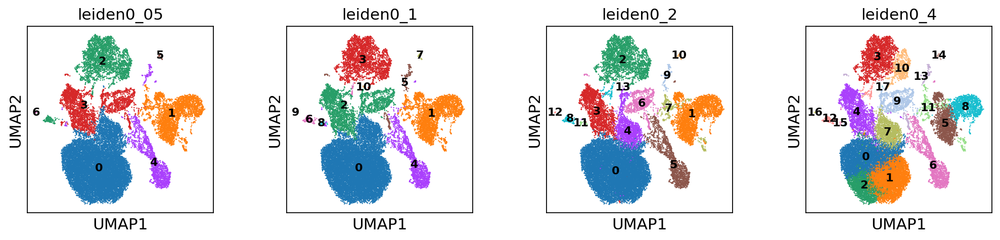

In [20]:
# Great article on community detection -> https://timoast.github.io/blog/community-detection/
sc.tl.leiden(adata, resolution=0.05, key_added='leiden0_05')
sc.tl.leiden(adata, resolution=0.1, key_added='leiden0_1')
sc.tl.leiden(adata, resolution=0.2, key_added='leiden0_2')
sc.tl.leiden(adata, resolution=0.4, key_added='leiden0_4')

leiden_clusts=['leiden0_05','leiden0_1','leiden0_2','leiden0_4']

rcParams["figure.facecolor"]='white'
rcParams['figure.figsize'] = 3,3
sc.pl.umap(adata, color=leiden_clusts, hspace=0.5, legend_fontsize=10,legend_loc='on data', size=5, 
frameon=True, show=False)

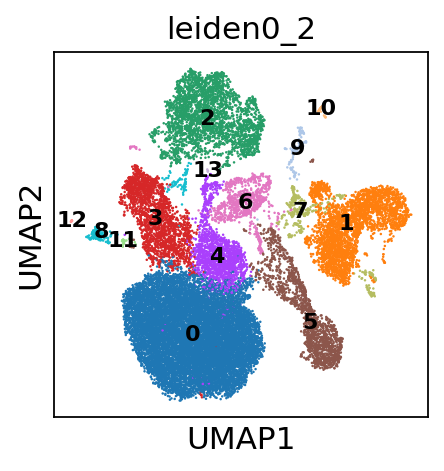

In [40]:
# for a figure
rcParams["figure.facecolor"]='white'
rcParams['figure.figsize'] = 3,3
sc.pl.umap(adata, color=['leiden0_2'], hspace=0.5, legend_fontsize=10,legend_loc='on data', size=5, 
frameon=True, show=False)

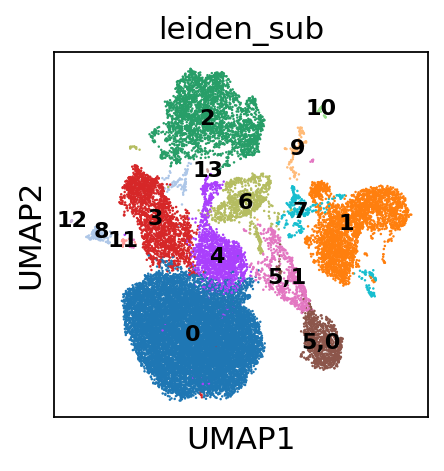

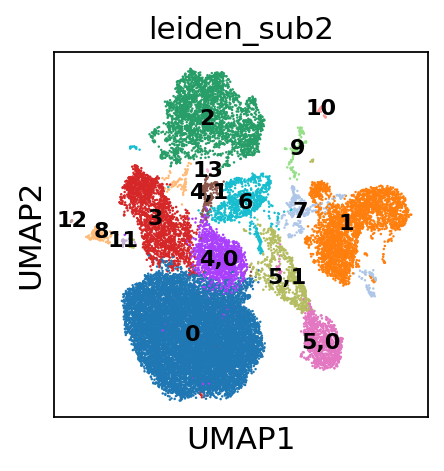

In [27]:
# make a copy of the data
bdata = adata.copy()

# first round
# I should be able to subcluster Cluster 5 based on Lyz2 and Sftpc expression
sc.tl.leiden(bdata, resolution=0.05, restrict_to = ('leiden0_2', ['5']) ,key_added='leiden_sub')

rcParams["figure.facecolor"]='white'
rcParams['figure.figsize'] = 3,3
sc.pl.umap(bdata, color=['leiden_sub'], hspace=0.5, legend_fontsize=10,legend_loc='on data', size=5, 
frameon=True, show=False)

# 2nd round
# Trying to subset the cells with high Scgb1a1 and Scgb3a2
sc.tl.leiden(bdata, resolution=0.05, restrict_to = ('leiden_sub', ['4']) ,key_added='leiden_sub2')

rcParams["figure.facecolor"]='white'
rcParams['figure.figsize'] = 3,3
sc.pl.umap(bdata, color=['leiden_sub2'], hspace=0.5, legend_fontsize=10,legend_loc='on data', size=5, 
frameon=True, show=False)

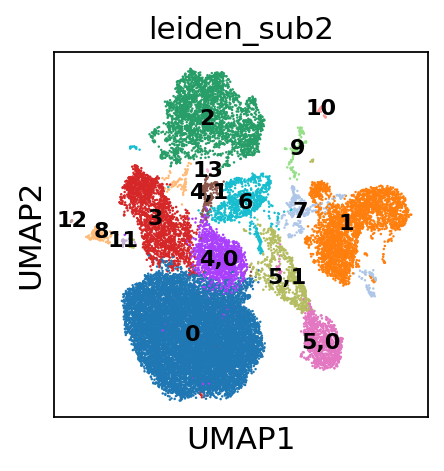

In [28]:
# Apply subclustering to the main data

# first round
sc.tl.leiden(adata, resolution=0.05, restrict_to = ('leiden0_2', ['5']) ,key_added='leiden_sub')

# 2nd round
sc.tl.leiden(adata, resolution=0.05, restrict_to = ('leiden_sub', ['4']) ,key_added='leiden_sub2')

rcParams["figure.facecolor"]='white'
rcParams['figure.figsize'] = 3,3
sc.pl.umap(adata, color=['leiden_sub2'], hspace=0.5, legend_fontsize=10,legend_loc='on data', size=5, 
frameon=True, show=False)

#### RNA Velocity on pre-computed low dimensional embedding
- Merge velocity and computed adata

In [55]:
# crete anndata using velocyto loom output files
filenames = [
'/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/FC_05791/Unaligned_1234_PF_TenX_mm1/cellranger/cellranger_count/FEB4_POOL2_SL2_SI-GA-A9/velocyto/FEB4_POOL2_SL2_SI-GA-A9.loom',
'/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/FC_05793/Unaligned_1234_PF_TenX_mm1/cellranger/cellranger_count/FEB4_POOL3_SL3_SI-GA-A10/velocyto/FEB4_POOL3_SL3_SI-GA-A10.loom', 
'/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/FC_05802/Unaligned_1234a_PF_TenX_mm1/cellranger/cellranger_count/FEB4_POOL4_SL5_SI-GA-A12/velocyto/FEB4_POOL4_SL5_SI-GA-A12.loom', 
'/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/FC_05802/Unaligned_1234a_PF_TenX_mm1/cellranger/cellranger_count/FEB4_POOL4_SL6_SI-GA-B1/velocyto/FEB4_POOL4_SL6_SI-GA-B1.loom',    
'/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/FC_05808/Unaligned_1234a_PF_TenX_mm1/cellranger/cellranger_count/FEB4_POOL5_SL12_SI-GA-B9/velocyto/FEB4_POOL5_SL12_SI-GA-B9.loom',
'/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/FC_05808/Unaligned_1234a_PF_TenX_mm1/cellranger/cellranger_count/FEB4_POOL5_SL14_SI-GA-B10/velocyto/FEB4_POOL5_SL14_SI-GA-B10.loom',
'/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/FC_05802/Unaligned_1234a_PF_TenX_mm1/cellranger/cellranger_count/FEB4_POOL4_SL15_SI-GA-B4/velocyto/FEB4_POOL4_SL15_SI-GA-B4.loom'    
    ]

bdatas = [sc.read_loom(filename) for filename in filenames]
bdata = bdatas[0].concatenate(bdatas[1:], batch_categories=['SL2','SL3','SL5','SL6','SL12','SL14','SL15'])
bdata.var_names_make_unique() 

# Make a copy of adata files with computed UMAP for merging with loom anndata files
adata_velo = adata.copy()

''''''''''
Merge velocyto data with filtered adata contain computed UMAP

Credit: Merging scvelo with adata
https://github.com/theislab/scvelo/issues/37

'''''''''

merged = scv.utils.merge(adata_velo, bdata)
print('Number of cells after merge:',len(merged.obs.index))

# Create velocity graphs
scv.tl.velocity(merged)
scv.tl.velocity_graph(merged)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Making variable names unique for controlled concatenation.


Number of cells after merge: 25056
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:20) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:42) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)
computing velocities
    finished (0:02:12) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:33:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


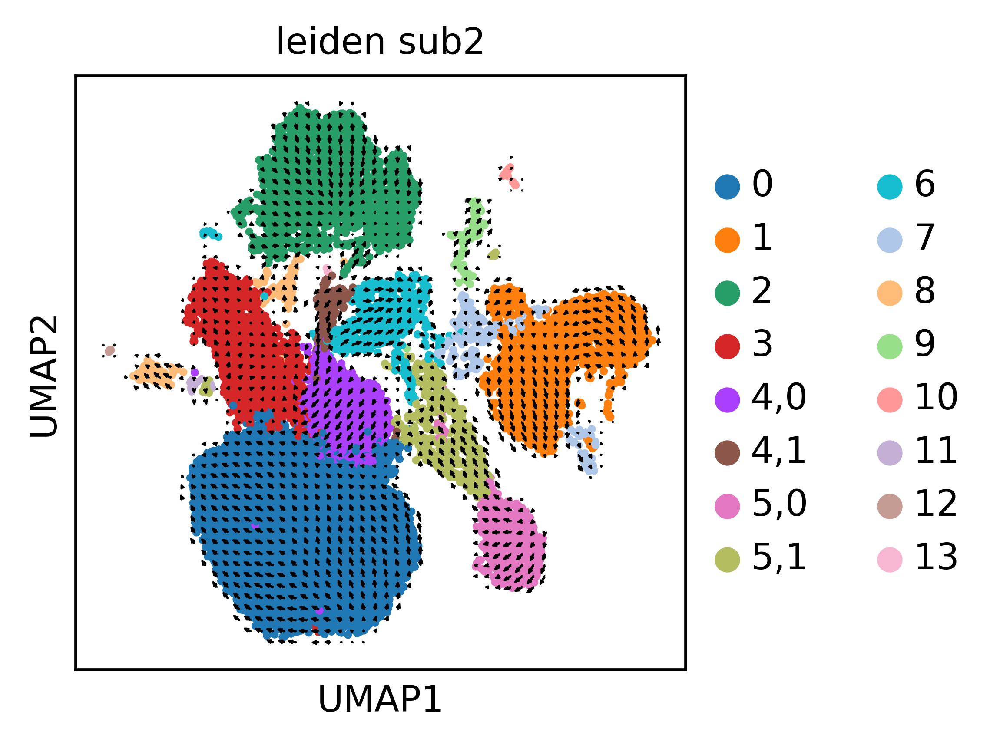

In [7]:
with axes_style({'axes.grid': False}):
 ax=scv.pl.velocity_embedding_grid(merged, density=1, basis='umap', arrow_length=2, arrow_size=1, 
 alpha=1, color=['leiden_sub2'], legend_loc='right margin', size=size, ncols=2, 
 figsize=figsize, dpi=(300), frameon=True, color_map=cmap, fontsize=10, legend_fontsize=10,
 vmin=-2, vmax=2, arrow_color=arrow_color, linewidth=0.5)

#### Calculate Cell Type Signature Scores in the SCA1- dataset to identify clusters

In [ ]:
start = time.time()

# create cell barcodes column in adata.obs using the index
adata.obs['cell_barcodes'] = adata.obs.index

# Dictionary with cell type (key) and genes (values)
epi_marker_dict = {}

print
epi_df = pd.read_excel('/n/data2/bch/hemonc/ckim/AARON/20190114_KRASYFP_7weeks/scanpy_analysis/epithelial_mesenchymal_marker_genes.xlsx', sheet_name='epithelial', header=0)
celltype_list = ['Pulmonary alveolar type II cells','Pulmonary alveolar type I cells','Clara cells','Ciliated cells', 'Goblet cells', 'Basal cells']

for i in celltype_list:
        subset = epi_df.loc[(epi_df['cell type'] == i) & (epi_df['species'] != 'Hs')]
        genes = subset['official gene symbol'].tolist()
        genes = [x.lower() for x in genes] # lower names
        genes = [x.capitalize() for x in genes] # capitalize names
        epi_marker_dict.update({i:genes})


# print genes per dict key
for k,v in epi_marker_dict.items():
    print(f'{k}:', len(v))
    
# Calculate score
def evaluate_partition(anndata, marker_dict, gene_symbol_key=None, partition_key=None):
    # Inputs:
    #    anndata         - An AnnData object containing the data set and a partition
    #    marker_dict     - A dictionary with cell-type markers. The markers should be stores as anndata.var_names or 
    #                      an anndata.var field with the key given by the gene_symbol_key input
    #    gene_symbol_key - The key for the anndata.var field with gene IDs or names that correspond to the marker 
    #                      genes
    #    partition_key   - The key for the anndata.obs field where the cluster IDs are stored. The default is
    #                      'louvain_r1' 

    #Test inputs
    if partition_key not in anndata.obs.columns.values:
        print('KeyError: The partition key was not found in the passed AnnData object.')
        print('   Have you done the clustering? If so, please tell pass the cluster IDs with the AnnData object!')
        raise

    if (gene_symbol_key != None) and (gene_symbol_key not in anndata.var.columns.values):
        print('KeyError: The provided gene symbol key was not found in the passed AnnData object.')
        print('   Check that your cell type markers are given in a format that your anndata object knows!')
        raise
        
    if gene_symbol_key:
        gene_ids = anndata.var[gene_symbol_key]
    else:
        gene_ids = anndata.var_names
        
    
    # I created a column based on index. This allows z-score calculation on single cells rather than clusters
    clusters = np.unique(anndata.obs[partition_key])
    n_clust = len(clusters)
    n_groups = len(marker_dict)
    
    marker_res = np.zeros((n_groups, n_clust))
    z_scores = sc.pp.scale(anndata, copy=True) # original data is not scaled

    i = 0
    for group in marker_dict:
        print(f'Calculating signature for {group}')
        # Find the corresponding columns and get their mean expression in the cluster
        j = 0
        for clust in clusters:
            cluster_cells = np.in1d(z_scores.obs[partition_key], clust)
            marker_genes = np.in1d(gene_ids, marker_dict[group])
            marker_res[i,j] = z_scores.X[np.ix_(cluster_cells,marker_genes)].mean()
            j += 1
        i+=1

    variances = np.nanvar(marker_res, axis=0)
    if np.all(np.isnan(variances)):
        print("No variances could be computed, check if your cell markers are in the data set.")
        print("Maybe the cell marker IDs do not correspond to your gene_symbol_key input or the var_names")
        raise

    marker_res_df = pd.DataFrame(marker_res, columns=clusters, index=marker_dict.keys())
    
    return marker_res_df

# Calculate signature scores for each cell
df = evaluate_partition(adata, epi_marker_dict, gene_symbol_key=None, 
partition_key = 'cell_barcodes')

# Transpose the dataframe
df_transposed = df.transpose()

# Add data to adata.obs
for column in df_transposed.columns:
    adata.obs[column] = df_transposed[column]

end = time.time()
print('Total run time (min):', (end - start)/60)

### Create a subset data without stromal cells from organoid co-culture
- Recompute knn and UMAP
- Determine leiden clusters at multiple resolutions

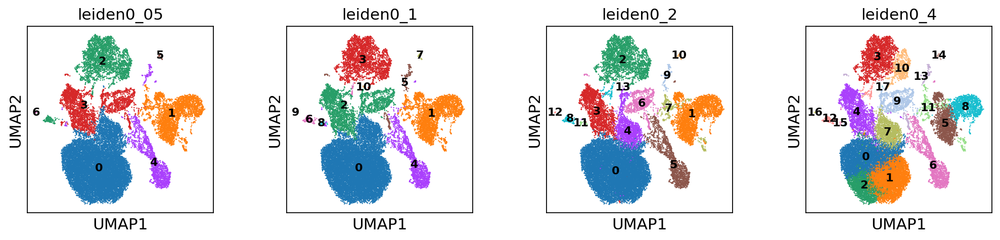

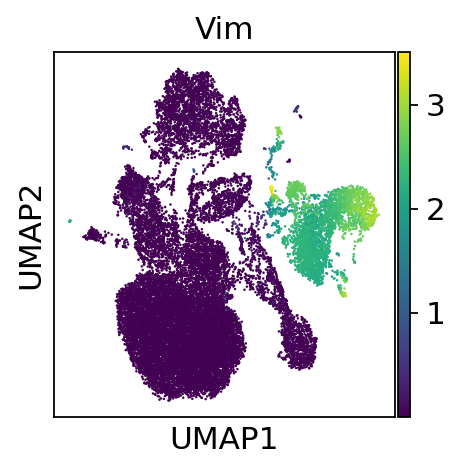

In [6]:
# Removal stromal cell contamination from organoid co-cultures

leiden_clusts=['leiden0_05','leiden0_1','leiden0_2','leiden0_4']

rcParams["figure.facecolor"]='white'
rcParams['figure.figsize'] = 3,3
sc.pl.umap(adata, color=leiden_clusts, hspace=0.5, legend_fontsize=10,legend_loc='on data', size=5, 
frameon=True, show=False)

sc.pl.umap(adata, color=['Vim'], hspace=0.5, legend_fontsize=10,legend_loc='on data', size=5, 
frameon=True, use_raw=False, show=False)

### After removing Vim+ organoid cells recompute UMAP

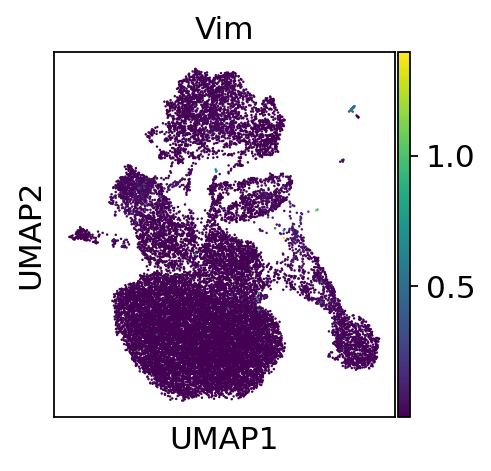

In [8]:
# At leiden0_1, remove clusters with high Vim expression. 
# Clusters 1, 5, and 9

# remove unwanted clusters
adata_sub = adata[~adata.obs['leiden0_1'].isin(['1','5','9'])]

# check cluster removal worked
sc.pl.umap(adata_sub, color=['Vim'], hspace=0.5, legend_fontsize=10,legend_loc='on data', size=5, 
frameon=True, use_raw=False, show=False)

# recompute knn and UMAP
sc.pp.neighbors(adata_sub, n_neighbors=5, n_pcs=20)
sc.tl.umap(adata_sub)

After removal of Vim+ cells


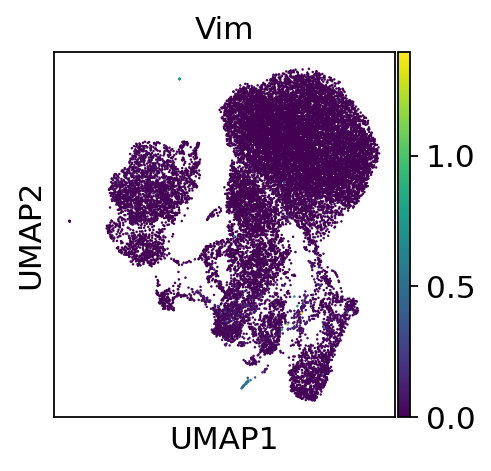

In [10]:
# View new UMAP
print('After removal of Vim+ cells')
sc.pl.umap(adata_sub, color=['Vim'], hspace=0.5, legend_fontsize=10,legend_loc='on data', size=5, 
frameon=True, use_raw=False, show=False, vmin=0)

### Calculate leiden clusters at multiple resolutions

In [11]:
sc.tl.leiden(adata_sub, resolution=0.025, key_added='leiden0_025')
sc.tl.leiden(adata_sub, resolution=0.05, key_added='leiden0_05')
sc.tl.leiden(adata_sub, resolution=0.1, key_added='leiden0_1')
sc.tl.leiden(adata_sub, resolution=0.2, key_added='leiden0_2')
sc.tl.leiden(adata_sub, resolution=0.4, key_added='leiden0_4')

In [9]:
# aesthetic change
adata_sub.uns.update({'groups_colors':['lightcoral','lightblue','gold']})

In [ ]:
clusts=['leiden0_025','leiden0_05','leiden0_1','leiden0_2','leiden0_4', 'batch', 'groups']
  
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ['blue','white','red'])

rcParams["figure.facecolor"]='white'
rcParams['figure.figsize'] = 3,3
plt.rcParams['axes.titlesize'] = 10
sc.pl.umap(adata_sub, color=clusts, hspace=0.5, legend_fontsize=10, legend_loc='right margin', size=5, 
frameon=False, show=False)

### Remove clusters with fewer than 200 cells

In [19]:
# I wanted to know how many cells were in each cluster. Cluster 5 and 6 have less than 10 cells each so I removed them.
adata_sub.obs['leiden0_05'].value_counts()

# No need to recompute the UMAP because the clusters were tiny.

0    14003
1     2864
2     2798
3     1606
4      180
5        7
6        6
Name: leiden0_05, dtype: int64

In [5]:
# Remove
adata_sub_2 = adata_sub[~adata_sub.obs['leiden0_05'].isin(['4','5','6'])]
adata_sub_2.obs['leiden0_05'].value_counts()

0    14003
1     2864
2     2798
3     1606
Name: leiden0_05, dtype: int64

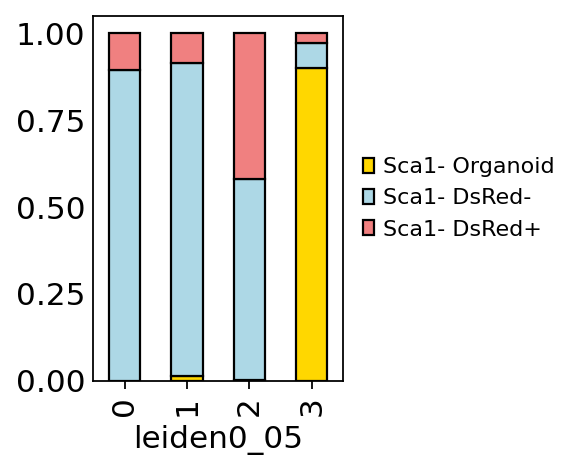

In [13]:
# Visualize "group" contribution for each leiden cluster

df=adata_sub_2.obs.copy()
df_plot = df.groupby(['leiden0_05', 'groups']).size().reset_index().pivot(columns='groups', index='leiden0_05', values=0)

# normalize rows
# Credit: https://stackoverflow.com/questions/26537878/pandas-sum-across-columns-and-divide-each-cell-from-that-value
df3 = df_plot.div(df_plot.sum(axis=1), axis=0)

order = ['Sca1- Organoid', 'Sca1- DsRed-', 'Sca1- DsRed+']
df3 = df3[order]

# plot

color = ['gold','lightblue','lightcoral']

rcParams['figure.figsize'] = 2,3
with axes_style({'axes.grid': False}):
    ax = df3.plot(kind='bar', stacked=True, edgecolor='black', color = color
                 )
    ax.legend(loc='center left', bbox_to_anchor=(1., 0.5), ncol=1, frameon=False, title='', 
    title_fontsize=10, fontsize=10)
    ax.tick_params(axis=u'y', which=u'both',length=0)

#### Determine the identity of Cluster 1 (leiden = 0.05)

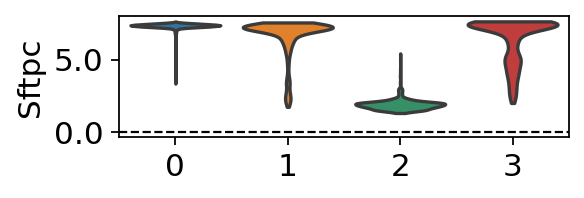

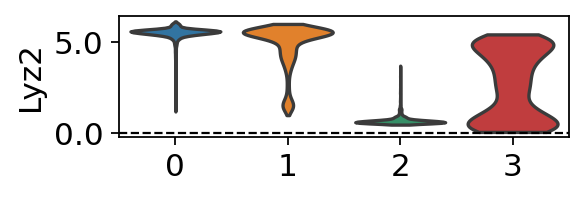

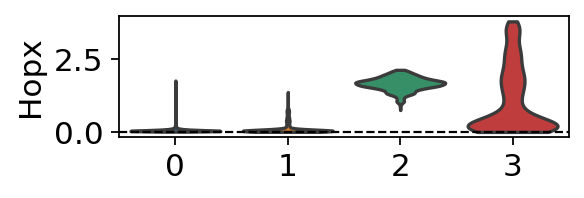

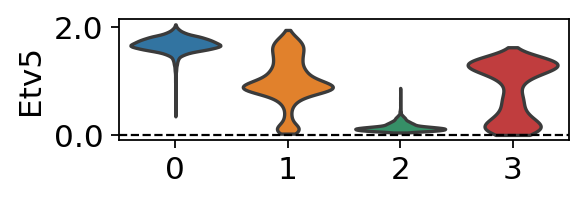

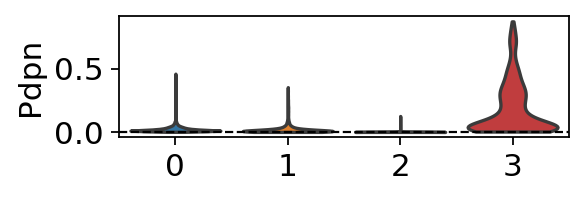

...

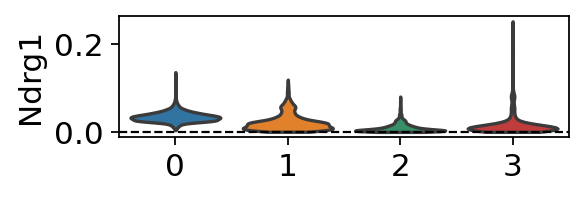

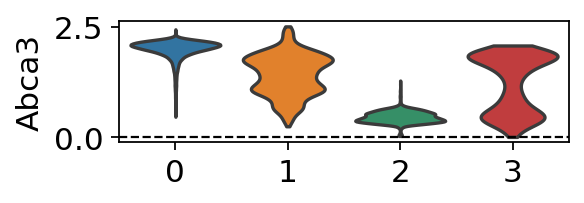

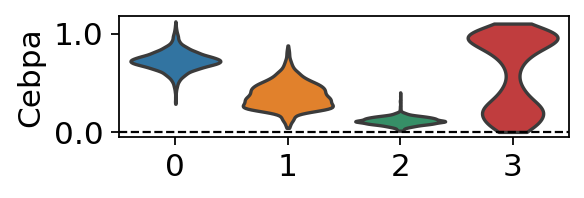

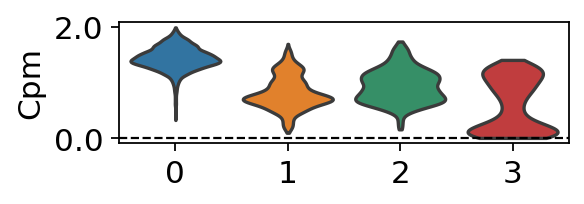

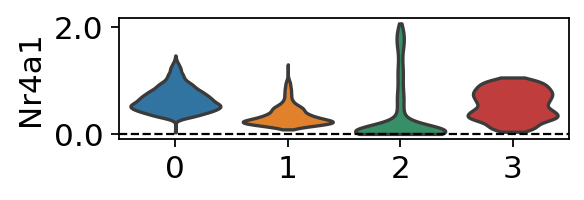

In [15]:
lst = [
    'Sftpc','Lyz2','Hopx', 'Etv5','Pdpn','Trp63','Muc5b','Scgb1a1','Scgb3a2','Foxj1', # canonical epithelial markers
    'Axin2', 'Tm4sf1', # AT2 stem cells
    'Cdk1', 'Mki67', # proliferation
    'Cd44', # mark a subset of AT2 cells: doi:10.1152/ajpcell.00341.2020
    'Ascl3','Cftr', # ionocyte genes
    'Muc5b', # Secretory cells
    'Pecam1','Epcam','Ptprc','Vim', # Endo, epi, immune, and mes markers  
    'Hbb-bs', # blood
    'Cldn4','Krt8','Cdkn1a','Ly6a','Ndrg1', # DAPT
    'Abca3','Cebpa','Cpm','Nr4a1' # Lower expression in primed AT2 vs "normal" AT2
      ]

for i in lst:
    rcParams['figure.figsize']=4,1
    rcParams['figure.facecolor']='white'
    with axes_style({'axes.grid': False}):
        ax=sc.pl.violin(adata_sub_2, i, groupby='leiden0_05', use_raw=False,
        jitter = False, stripplot = False, show=False)
        plt.xlabel('')
        #ax.set_xticklabels(labels, rotation = 90)
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
        ax.axhline(0, linewidth=1, color='black', linestyle='dashed')
        #ax.set_ylim(0)

### Primed AT2 genes

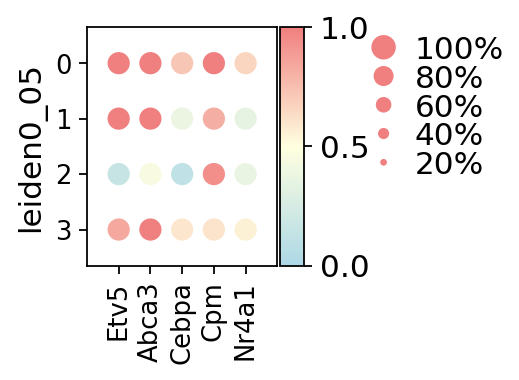

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[1.55, 0, 0.2, 0.5, 0.25])

In [25]:
genes = ['Etv5','Abca3','Cebpa','Cpm','Nr4a1']

cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ['lightblue','lightyellow','lightcoral'])
sc.pl.dotplot(adata_sub_2, genes, color_map=cmap, groupby='leiden0_05', use_raw=False,
             vmin=0, vmax=1, figsize=((len(genes)*0.5), len(list(set(adata_sub_2.obs['leiden0_05'])))*0.5))

### Cluster annotations
- Cluster 0 = AT2 cells
- Cluster 1 = Primed AT2 cells (https://pubmed.ncbi.nlm.nih.gov/32750316/)
- Cluster 2 = Ciliated cells
- Cluster 3 = Transplanted AT2 org cells

    * AT2 cells defined by high expression of Etv5, Lyz2, and Sftpc
    * Primed AT2 cells defined by lower expression of Etv5, but comparable Lyz2, and Sftpc relative to AT2 cells
    * Transplanted AT2 org cells defined by metadata
    * Ciliated cells defined by Foxj1 expression and a ciliated signature score from PanglaoDB

#### Add an annotations columns

In [27]:
adata_sub_2.obs['annot'] = adata_sub_2.obs['leiden0_05']

scores = adata_sub_2.obs[['leiden0_05']]

annotation = pd.Series('Undetermined', index=scores.index)
annotation[(scores['leiden0_05'] == '0')] = 'AT2'  
annotation[(scores['leiden0_05'] == '1')] = 'Primed AT2'  
annotation[(scores['leiden0_05'] == '2')] = 'Ciliated'  
annotation[(scores['leiden0_05'] == '3')] = 'AT2-Org Transp.'  

adata_sub_2.obs['annot'] = annotation

#### Set the color palette

In [10]:
adata_sub_2.uns['leiden0_05_colors']

array(['#1f77b4', '#ff7f0e', '#279e68', '#d62728'], dtype=object)

In [10]:
# Manually align color palette in adata.uns
adata_sub_2.uns.update({'annot_colors':['#1f77b4', '#d62728', '#279e68','#ff7f0e']})

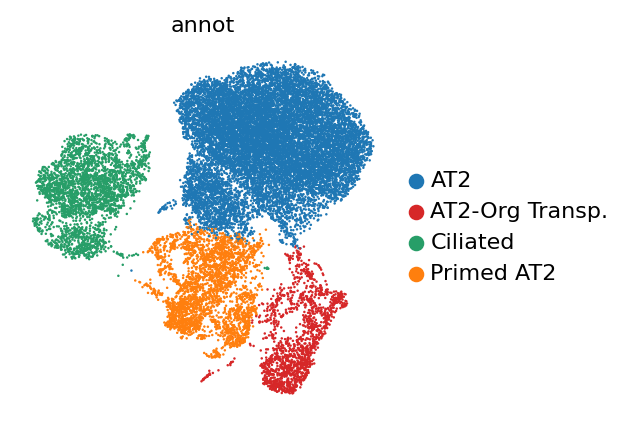

In [9]:
rcParams["figure.facecolor"]='white'
rcParams['figure.figsize'] = 3,3
plt.rcParams['axes.titlesize'] = 10
sc.pl.umap(adata_sub_2, color=['annot'], hspace=0.5, legend_fontsize=10, legend_loc='right margin', size=5, 
frameon=False, show=False)

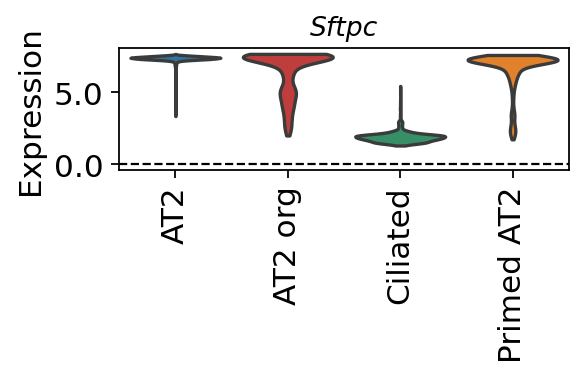

In [10]:
lst = ['Sftpc']
labels = ['AT2','AT2 org','Ciliated','Primed AT2']

for i in lst:
    rcParams['figure.figsize']=4,1
    rcParams['figure.facecolor']='white'
    with axes_style({'axes.grid': False}):
        ax=sc.pl.violin(adata_sub_2, i, groupby='annot', use_raw=False,
        jitter = False, stripplot = False, palette = adata_sub_2.uns['annot_colors'], show=False)
        plt.xlabel('')
        plt.ylabel('Expression')
        plt.title(i, fontsize=12, fontstyle='italic')
        ax.set_xticklabels(labels, rotation = 90)
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
        ax.axhline(0, linewidth=1, color='black', linestyle='dashed')

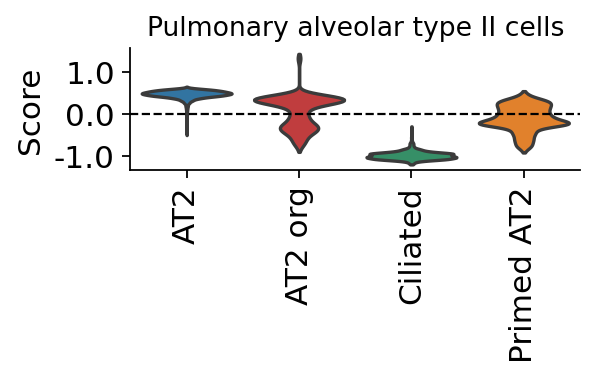

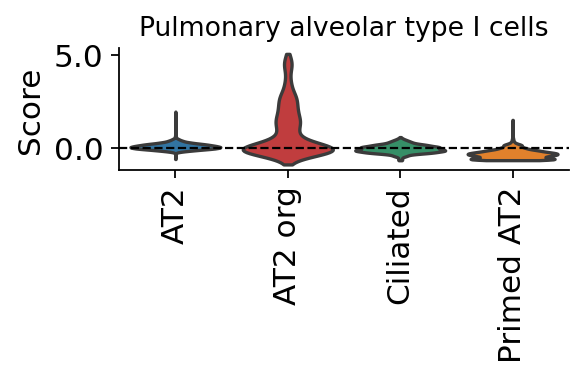

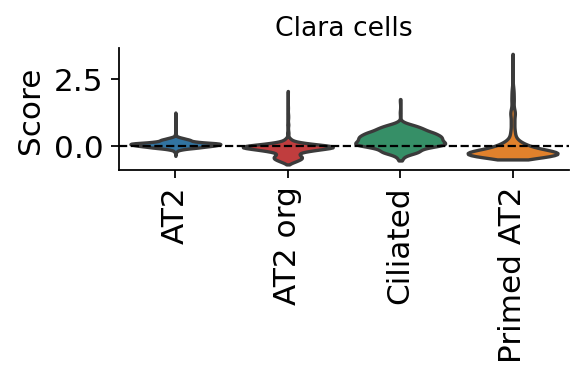

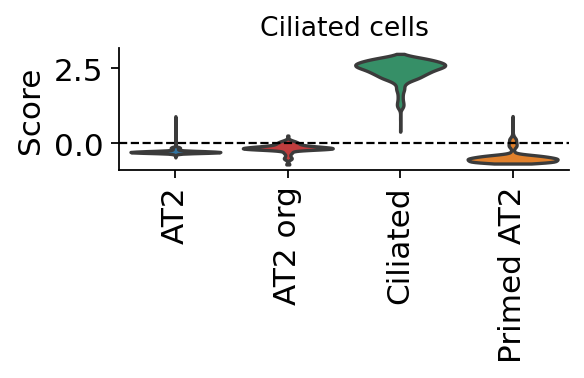

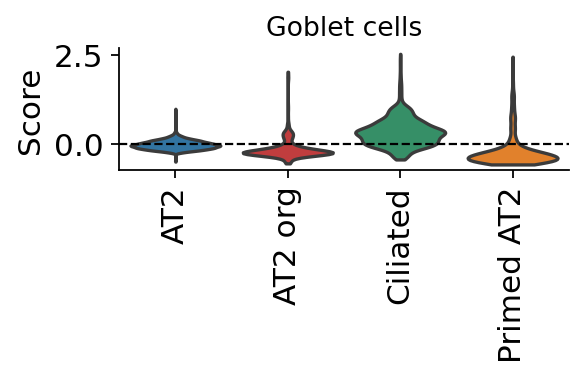

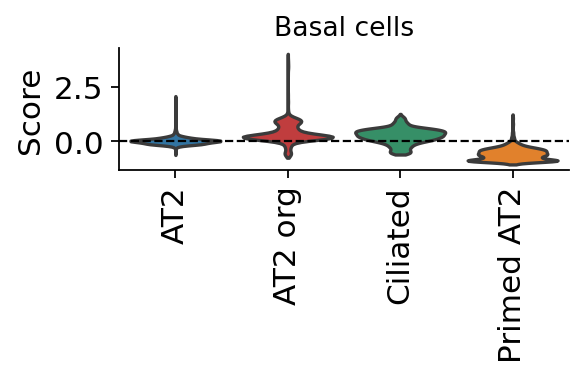

In [12]:
lst = ['Pulmonary alveolar type II cells','Pulmonary alveolar type I cells', 'Clara cells', 'Ciliated cells','Goblet cells','Basal cells']
labels = ['AT2','AT2 org','Ciliated','Primed AT2']

for i in lst:
    rcParams['figure.figsize']=4,1
    rcParams['figure.facecolor']='white'
    with axes_style({'axes.grid': False}):
        ax=sc.pl.violin(adata_sub_2, i, groupby='annot', use_raw=False,
        jitter = False, stripplot = False, palette = adata_sub_2.uns['annot_colors'], show=False)
        despine(right = True)
        plt.ylabel('Score')
        plt.xlabel('')
        plt.title(i, fontsize=12)
        ax.set_xticklabels(labels, rotation = 90)
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
        ax.axhline(0, linewidth=1, color='black', linestyle='dashed')

#### Perform differential expression analysis

In [56]:
ngenes = 3000
method = 'wilcoxon'
groupby = 'annot'

sc.tl.rank_genes_groups(adata_sub_2, groupby=groupby, key_added=f'rank_genes_{groupby}',
method = method, n_genes=ngenes)

# save data to adata_subset.uns
result = adata_sub_2.uns[f'rank_genes_{groupby}']
groups = result['names'].dtype.names

de_data = pd.DataFrame({group + '_' + key[:1]: result[key][group] for group in groups for key in ['names', 'pvals_adj','logfoldchanges']})
de_data.to_excel(f"/n/data2/bch/hemonc/ckim/SHARON/20210324_Sca1Neg_adataSub2_leiden0_05_DE.xlsx", sheet_name='Sheet1')

### Filter DE data then plot as a dotplot

In [59]:
# Load DE gene data
groupby = 'annot'

result = adata_sub_2.uns[f'rank_genes_{groupby}']
groups = result['names'].dtype.names

de_data = pd.DataFrame({group + '_' + key[:1]: result[key][group] for group in groups for key in ['names', 'pvals_adj','logfoldchanges']})

# added list manually, because I restricted the clusters used for DE analysis
clusters = sorted(list(set(adata_sub_2.obs['annot'])))

top_10_DE_genes = dict()
top_DE_genes = dict()

for i in clusters:
    df1 = de_data.loc[(de_data[f'{i}_p'] < 0.05)] # filter insignificant genes
    df1 = df1[[f'{i}_n',f'{i}_p',f'{i}_l']] # only keep columns of interest
    top_genes = df1[f'{i}_n'].tolist() # create list for each cluster
    top_DE_genes.update({i:top_genes}) # dict for all sig genes
    print(f'Total marker_genes in {i} with pval<0.05', len(top_genes))
    top = top_genes[:10] 
    #l.append(top)
    top_10_DE_genes.update({i:top}) # dict for top 10 genes per cluster

Total marker_genes in AT2 with pval<0.05 3000
Total marker_genes in AT2-Org Transp. with pval<0.05 3000
Total marker_genes in Ciliated with pval<0.05 3000
Total marker_genes in Primed AT2 with pval<0.05 23


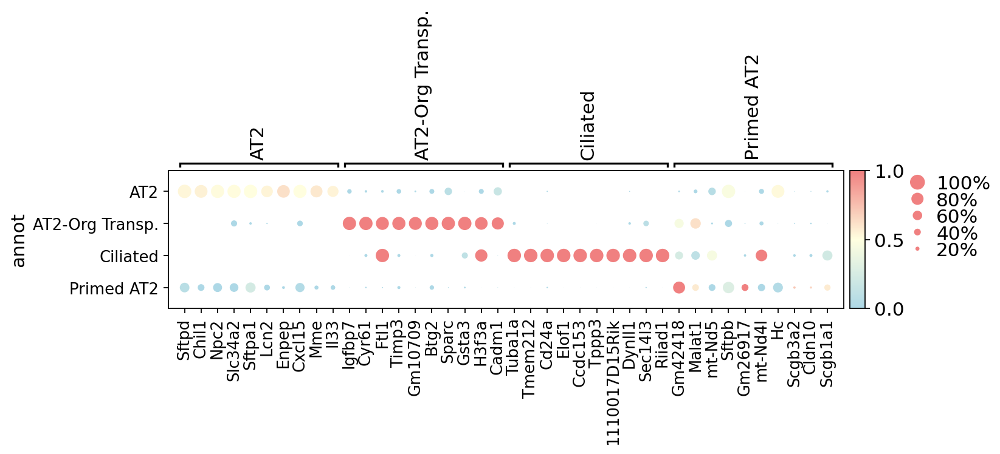

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[9.05, 0, 0.2, 0.5, 0.25])

In [62]:
# Plot

scaled = sc.pp.scale(adata_sub_2, copy=True)

cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ['lightblue','lightyellow','lightcoral'])
sc.pl.dotplot(scaled, top_10_DE_genes, color_map=cmap, groupby='annot', use_raw=False,
             vmin=0, vmax=1, figsize=(10,2))

### Group contirbutions for each cluster

#### Horizontal histogram

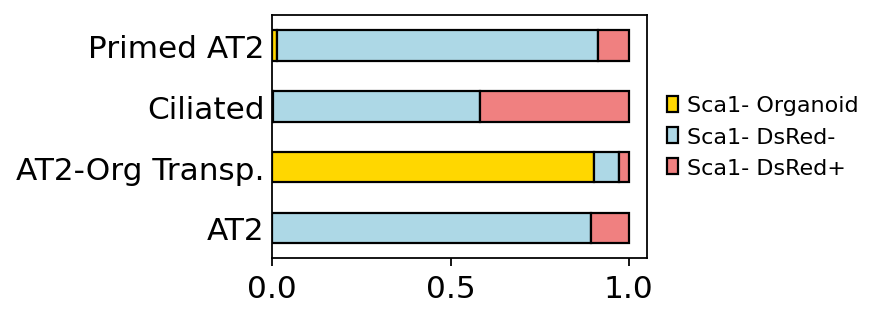

In [3]:
# Visualize "group" contribution for each leiden cluster

df=adata_sub_2.obs.copy()
df_plot = df.groupby(['annot', 'groups']).size().reset_index().pivot(columns='groups', index='annot', values=0)

# normalize rows
# Credit: https://stackoverflow.com/questions/26537878/pandas-sum-across-columns-and-divide-each-cell-from-that-value
df3 = df_plot.div(df_plot.sum(axis=1), axis=0)

order = ['Sca1- Organoid', 'Sca1- DsRed-', 'Sca1- DsRed+']
df3 = df3[order]
# re-order df
#df3 = df3.reindex(list(adata.uns['cluster_names_order']))

# plot

color = ['gold','lightblue','lightcoral']

rcParams['figure.figsize'] = 3,2
with axes_style({'axes.grid': False}):
    ax = df3.plot(kind='barh', stacked=True, edgecolor='black', color = color
                 )
    ax.legend(loc='center left', bbox_to_anchor=(1., 0.5), ncol=1, frameon=False, title='', 
    title_fontsize=10, fontsize=10)
    ax.set_ylabel("", rotation=90, labelpad=10, fontsize=10)
    ax.tick_params(axis=u'y', which=u'both',length=0)

#### UMAP

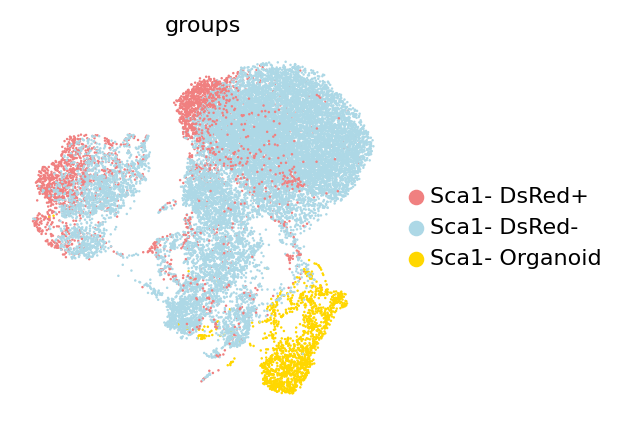

In [46]:
rcParams["figure.facecolor"]='white'
rcParams['figure.figsize'] = 3,3
plt.rcParams['axes.titlesize'] = 10
sc.pl.umap(adata_sub_2, color=['groups'], hspace=0.5, legend_fontsize=10, legend_loc='right margin', size=5, 
frameon=False, palette=['lightcoral','lightblue','gold'], show=False)

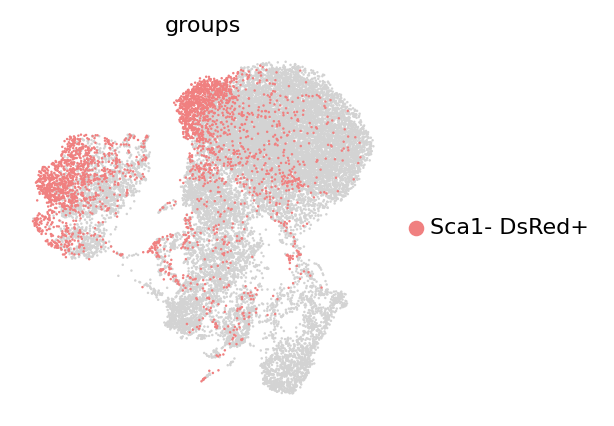

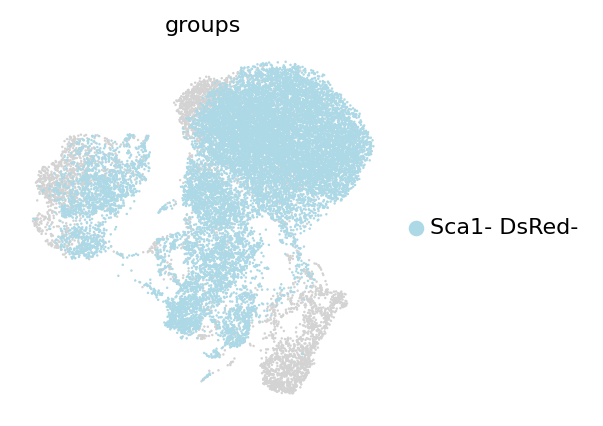

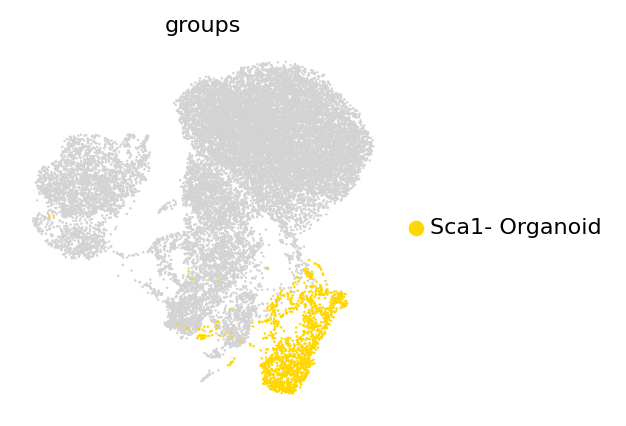

In [6]:
rcParams["figure.facecolor"]='white'
rcParams['figure.figsize'] = 3,3
plt.rcParams['axes.titlesize'] = 10
sc.pl.umap(adata_sub_2, color=['groups'], groups='Sca1- DsRed+', hspace=0.5, legend_fontsize=10, legend_loc='right margin', size=5, palette = ['lightcoral'], frameon=False,show=False)
sc.pl.umap(adata_sub_2, color=['groups'], groups='Sca1- DsRed-', hspace=0.5, legend_fontsize=10, legend_loc='right margin', size=5, palette = ['lightblue'], frameon=False,show=False)
sc.pl.umap(adata_sub_2, color=['groups'], groups='Sca1- Organoid', hspace=0.5, legend_fontsize=10, legend_loc='right margin', size=5, palette = ['gold'], frameon=False,show=False)

### Batch contirbutions for each cluster

#### Horizontal histogram, any color

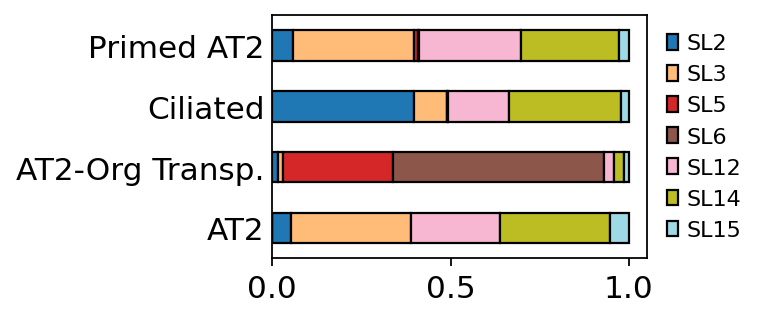

In [42]:
df=adata_sub_2.obs.copy()
df_plot = df.groupby(['annot','batch']).size().reset_index().pivot(columns='batch', index='annot', values=0)

# normalize rows
# Credit: https://stackoverflow.com/questions/26537878/pandas-sum-across-columns-and-divide-each-cell-from-that-value
df3 = df_plot.div(df_plot.sum(axis=1), axis=0)

# plot

color = adata_sub_2.uns['batch_colors']

rcParams['figure.figsize'] = 3,2
with axes_style({'axes.grid': False}):
    ax = df3.plot(kind='barh', stacked=True, edgecolor='black', color = color
                 )
    ax.legend(loc='center left', bbox_to_anchor=(1., 0.5), ncol=1, frameon=False, title='', 
    title_fontsize=10, fontsize=10)
    ax.set_ylabel("", rotation=90, labelpad=10, fontsize=10)
    ax.tick_params(axis=u'y', which=u'both',length=0)

#### UMAP with batch annotations. More descriptive titles were used in the manuscript

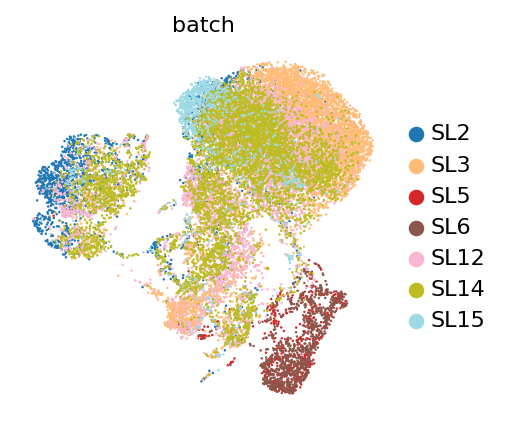

In [37]:
rcParams["figure.facecolor"]='white'
rcParams['figure.figsize'] = 3,3
plt.rcParams['axes.titlesize'] = 10
sc.pl.umap(adata_sub_2, color=['batch'], hspace=0.5, legend_fontsize=10, legend_loc='right margin', size=5, 
frameon=False, show=False)

### Plot Primed AT2 genes seperately
- Lyz2 and Sftpc should be similiar to AT2 clls
- Other genes should be lower

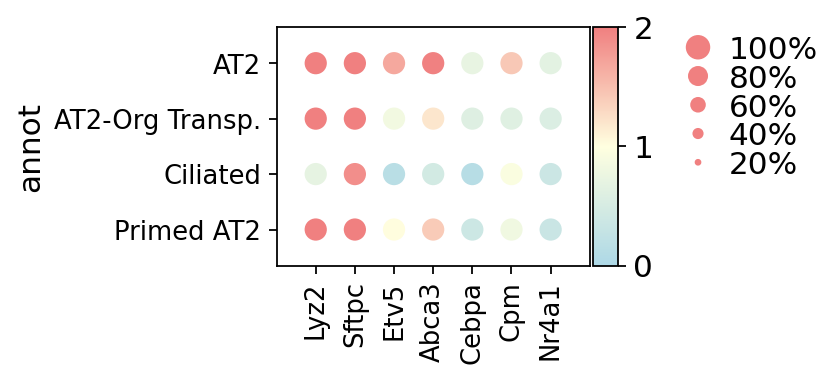

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[2.55, 0, 0.2, 0.5, 0.25])

In [32]:
genes = ['Lyz2','Sftpc','Etv5','Abca3','Cebpa','Cpm','Nr4a1']

cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ['lightblue','lightyellow','lightcoral'])
sc.pl.dotplot(adata_sub_2, genes, color_map=cmap, groupby='annot', use_raw=False,
             vmin=0, vmax=2, figsize=((len(genes)*0.5), len(list(set(adata_sub_2.obs['annot'])))*0.5))

#### Focused analysis on AT2 cells
- Find differences/similiarities between dsRed+ and dsRed- cells.
- Subet the AT2 cluster
- Re-compute UMAP but do not re-calculate leiden clusters!
- See how well dsRed+ and dsRed- cells overlap

Trying to set attribute `.uns` of view, copying.


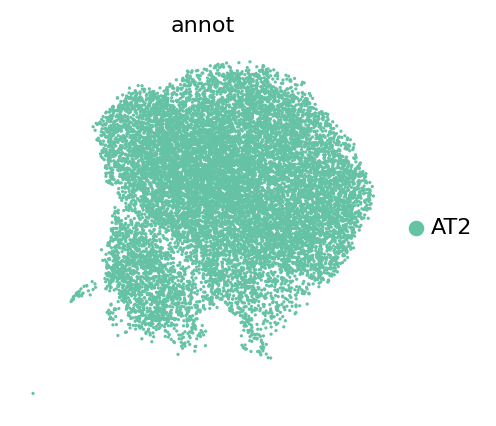

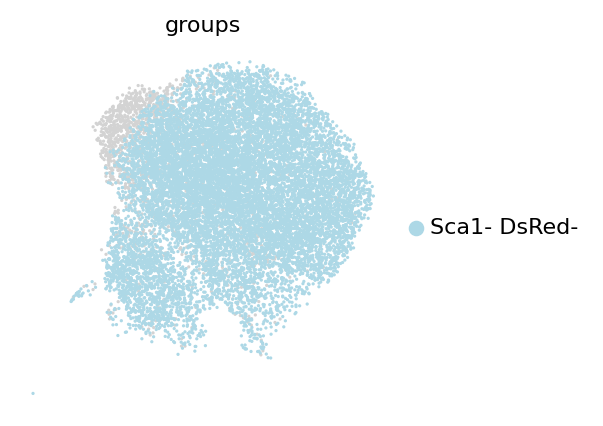

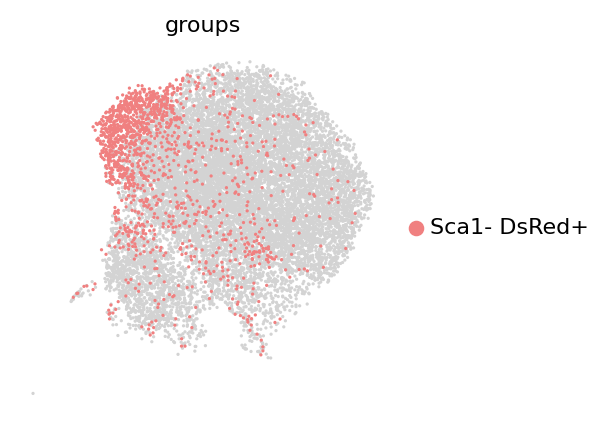

In [10]:
adata_at2 = adata_sub_2[adata_sub_2.obs['annot'].isin(['AT2'])]

rcParams["figure.facecolor"]='white'
rcParams['figure.figsize'] = 3,3
plt.rcParams['axes.titlesize'] = 10

sc.pl.umap(adata_at2, color=['annot'], hspace=0.5, legend_fontsize=10, legend_loc='right margin',
frameon=False, show=False)

sc.pl.umap(adata_at2, color=['groups'], groups=['Sca1- DsRed-'], hspace=0.5, legend_fontsize=10, legend_loc='right margin', 
palette=['lightblue'], frameon=False, show=False)

sc.pl.umap(adata_at2, color=['groups'], groups=['Sca1- DsRed+'], hspace=0.5, legend_fontsize=10, legend_loc='right margin', 
palette=['lightcoral'], frameon=False, show=False)

### Subset organoid cluster
- Subset AT2 organoid from scVelo data
- Recompute UMAP

In [108]:
# crete anndata using velocyto loom output files
filenames = [
'/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/FC_05791/Unaligned_1234_PF_TenX_mm1/cellranger/cellranger_count/FEB4_POOL2_SL2_SI-GA-A9/velocyto/FEB4_POOL2_SL2_SI-GA-A9.loom',
'/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/FC_05793/Unaligned_1234_PF_TenX_mm1/cellranger/cellranger_count/FEB4_POOL3_SL3_SI-GA-A10/velocyto/FEB4_POOL3_SL3_SI-GA-A10.loom', 
'/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/FC_05802/Unaligned_1234a_PF_TenX_mm1/cellranger/cellranger_count/FEB4_POOL4_SL5_SI-GA-A12/velocyto/FEB4_POOL4_SL5_SI-GA-A12.loom', 
'/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/FC_05802/Unaligned_1234a_PF_TenX_mm1/cellranger/cellranger_count/FEB4_POOL4_SL6_SI-GA-B1/velocyto/FEB4_POOL4_SL6_SI-GA-B1.loom',    
'/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/FC_05808/Unaligned_1234a_PF_TenX_mm1/cellranger/cellranger_count/FEB4_POOL5_SL12_SI-GA-B9/velocyto/FEB4_POOL5_SL12_SI-GA-B9.loom',
'/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/FC_05808/Unaligned_1234a_PF_TenX_mm1/cellranger/cellranger_count/FEB4_POOL5_SL14_SI-GA-B10/velocyto/FEB4_POOL5_SL14_SI-GA-B10.loom',
'/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/FC_05802/Unaligned_1234a_PF_TenX_mm1/cellranger/cellranger_count/FEB4_POOL4_SL15_SI-GA-B4/velocyto/FEB4_POOL4_SL15_SI-GA-B4.loom'    
    ]

bdatas = [sc.read_loom(filename) for filename in filenames]
bdata = bdatas[0].concatenate(bdatas[1:], batch_categories=['SL2','SL3','SL5','SL6','SL12','SL14','SL15'])
bdata.var_names_make_unique() 

# Make a copy of adata files with computed UMAP for merging with loom anndata files
adata_3 = adata_sub_2.copy()

''''''''''
Merge velocyto data with filtered adata contain computed UMAP

Credit: Merging scvelo with adata
https://github.com/theislab/scvelo/issues/37

'''''''''

org3 = scv.utils.merge(adata_3, bdata)
print('Number of cells after merge:',len(org3.obs.index))

# Create velocity graphs
scv.tl.velocity(org3)
scv.tl.velocity_graph(org3)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Making variable names unique for controlled concatenation.


Number of cells after merge: 21271
Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:23) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:36) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)
computing velocities
    finished (0:01:25) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:13:09) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [122]:
# save the velocity data using subset adata
orgVelo_results_file = '/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/scanpy_analysis/write/Sca1neg_SLonly_noSL13_Organoid_velo.h5ad'
org3.write(orgVelo_results_file)

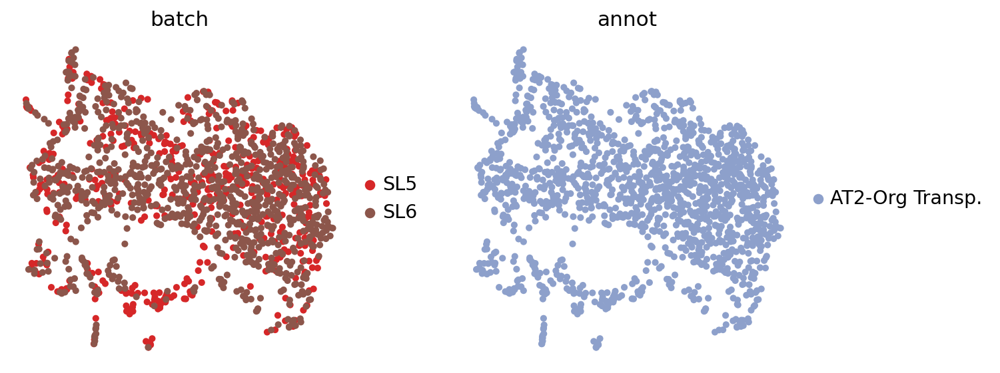

In [5]:
# subset data and plot velocity
# batch and leiden filter
orgSub2 = org3[org3.obs['annot'].isin(['AT2-Org Transp.']) & org3.obs['batch'].isin(['SL5','SL6'])]

#QC

# recompute neighbor graph and UMAP
sc.pp.neighbors(orgSub2, n_neighbors=5, n_pcs=20)
sc.tl.umap(orgSub2)

rcParams['figure.facecolor']='white'
sc.pl.umap(orgSub2, color=['batch','annot'], frameon=False)

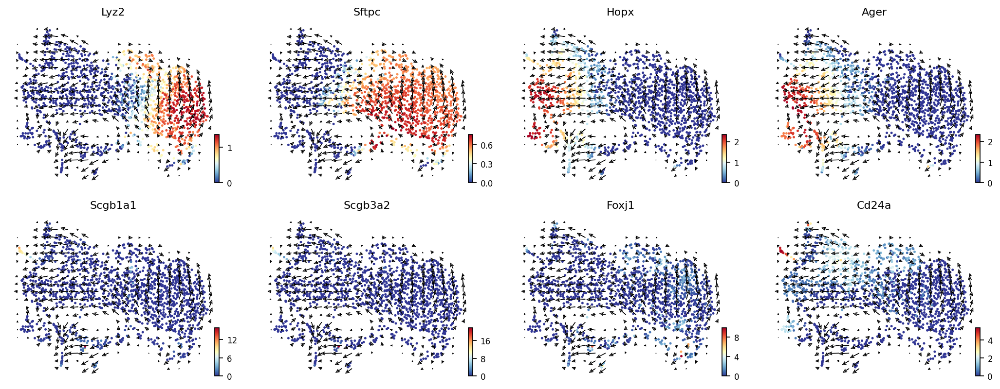

In [10]:
with axes_style({'axes.grid': False}):
 ax=scv.pl.velocity_embedding_grid(scaled, density=0.4, basis='umap', arrow_length=3, arrow_size=3, 
 alpha=1, color=genes, legend_loc='right margin', size=size, ncols=4, 
 figsize=figsize, dpi=(80), frameon=False, color_map=cmap, fontsize=10, legend_fontsize=10,
 vmin=0, arrow_color=arrow_color, use_raw=False, linewidth=0.5)

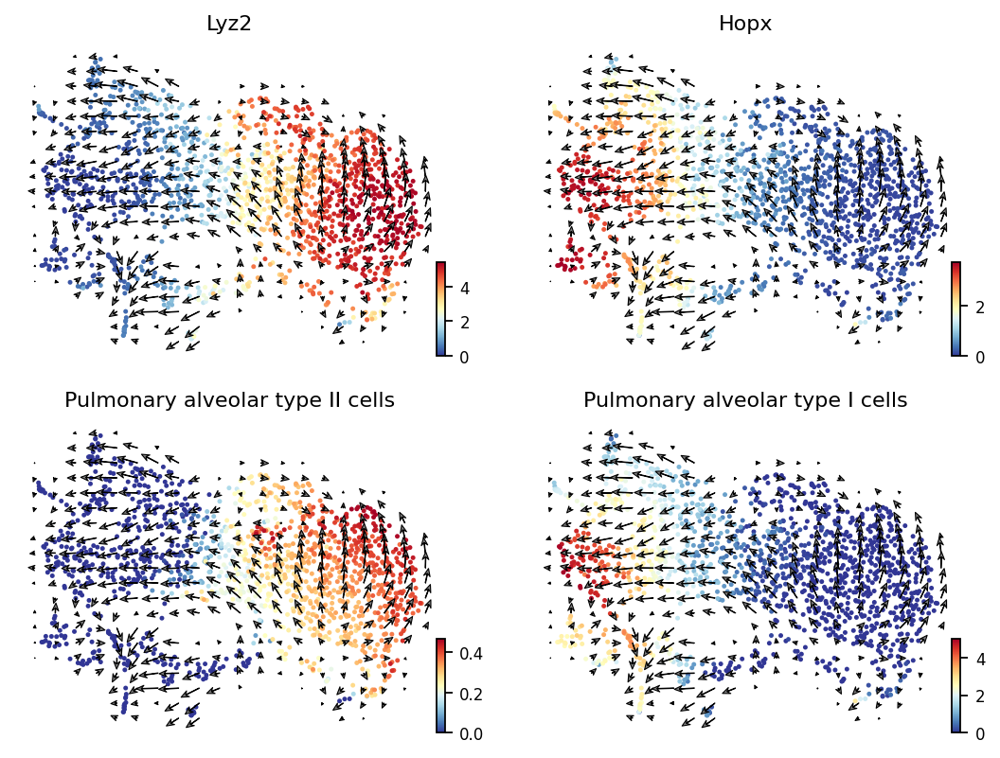

In [121]:
#cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ['white','red'])
cmap = 'RdYlBu_r'
arrow_color='black'
size=20
figsize=(4,3)
fontsize=10

genes = ['Lyz2','Hopx','Pulmonary alveolar type II cells','Pulmonary alveolar type I cells']

with axes_style({'axes.grid': False}):
 ax=scv.pl.velocity_embedding_grid(orgSub2, density=0.4, basis='umap', arrow_length=3, arrow_size=3, 
 alpha=1, color=genes, legend_loc='right margin', size=size, ncols=2, 
 figsize=figsize, dpi=(80), frameon=False, color_map=cmap, fontsize=10, legend_fontsize=10,
 vmin=0, arrow_color=arrow_color, use_raw=False, linewidth=0.5)

### Clustermap for signatures of interest

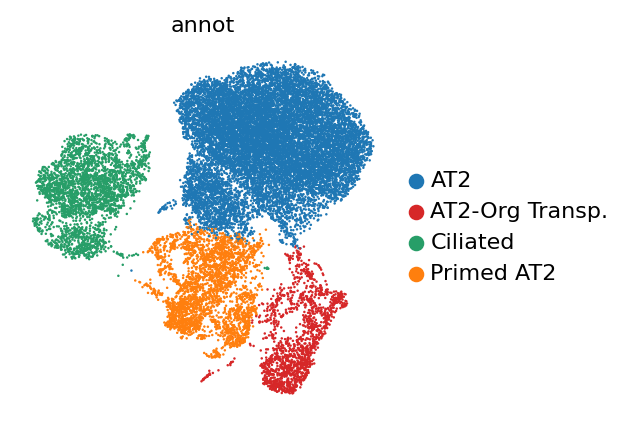

In [15]:
rcParams["figure.facecolor"]='white'
rcParams['figure.figsize'] = 3,3
plt.rcParams['axes.titlesize'] = 10
sc.pl.umap(adata_sub_2, color=['annot'], hspace=0.5, legend_fontsize=10, legend_loc='right margin', size=5, 
frameon=False, show=False)

In [20]:
print(adata_sub_2.uns['annot_colors'])
print(sorted(list(set(adata_sub_2.obs['annot']))))

['#1f77b4', '#ff7f0e', '#279e68', '#d62728']
['AT2', 'AT2-Org Transp.', 'Ciliated', 'Primed AT2']


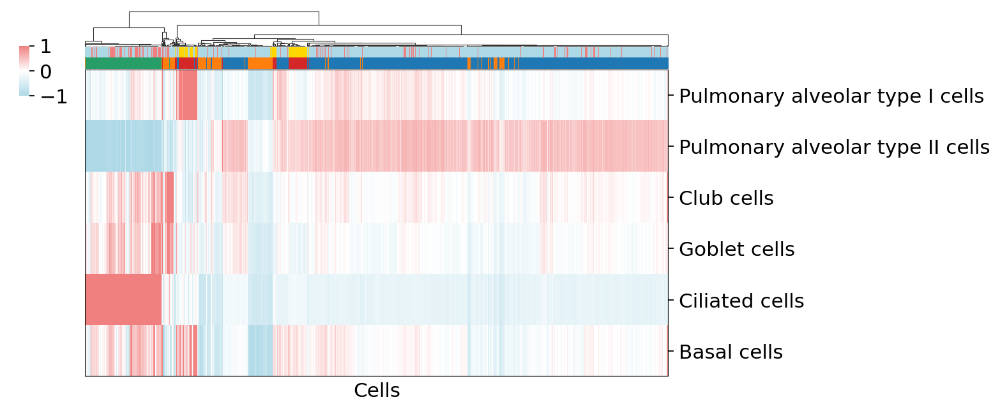

In [16]:
'''Get Clusters of Interest'''

cancer_df = adata_sub_2.copy()

# change Clara to Club. 
cancer_df.obs = cancer_df.obs.rename(columns={"Clara cells": "Club cells"})

df = pd.DataFrame(index=adata_sub_2.obs.index)

# signatures to be plotted
pathways=['Pulmonary alveolar type I cells','Pulmonary alveolar type II cells', 'Club cells', 
'Goblet cells','Ciliated cells','Basal cells']

# add to dataframe
for path in pathways:
    df[path]=cancer_df.obs[path]
 
cols=['Pulmonary alveolar type I cells','Pulmonary alveolar type II cells', 'Club cells', 
'Goblet cells','Ciliated cells','Basal cells']

# transpose dataframe. Creates desired orientation
df = df.T

# assign colormaps for row annotations

# grouped annotations colors - first row
louvain = cancer_df.obs['groups'].astype('object')
lut = {
'Sca1- Organoid': 'gold',
'Sca1- DsRed-': 'lightblue',
'Sca1- DsRed+': 'lightcoral'
}

col_colors = louvain.map(lut)

# leiden colors - second row
louvain2 = cancer_df.obs['annot'].astype('object')
lut2 = {
'AT2': '#1f77b4',
'AT2-Org Transp.':'#d62728',
'Ciliated': '#279e68',
'Primed AT2': '#ff7f0e'
}

col_colors2 = louvain2.map(lut2)

cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ['lightblue','white','lightcoral'])

# plot
g = sb.clustermap(df, vmin=-1, vmax=1, center=0, cmap=cmap, metric="correlation", row_cluster=False, col_cluster=True,
                   figsize=(10, 7), cbar_pos=(0.03, 0.85, .01, .07), # locxaxis,locyaxis,cbarwidth,cbarheight
                   col_colors=[col_colors, col_colors2], dendrogram_ratio=0.1
                   ) 
ax = g.ax_heatmap
ax.set_xticklabels([])
ax.set_xticks([])
ax.set_xlabel("Cells")
ax.axhline(y=0, color='black',linewidth=1)
ax.axhline(y=len(df.index), color='black',linewidth=1)
ax.axvline(x=0, color='black',linewidth=1)
ax.axvline(x=len(df.columns), color='black',linewidth=1)
plt.show()